In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mtcnn
!pip install face_recognition

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566164 sha256=035ece90f8a5175ee3bcba1a4c9fbef3e5bc91410ccf0fd6b9d97c12fe311cd6
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models


In [3]:
import cv2
import numpy as np
import face_recognition
import os
import matplotlib.pyplot as plt
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

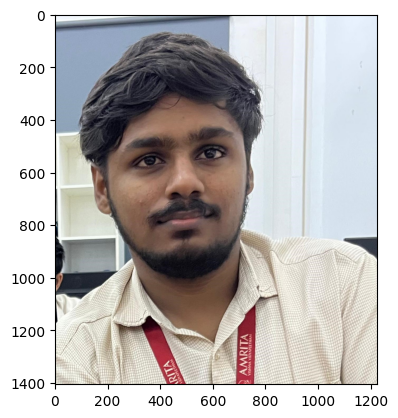

In [5]:
cv = cv2
img = cv.imread("/content/drive/MyDrive/College/Biometrics/test/jawakar/1.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img) # RGB

In [6]:
from mtcnn.mtcnn import MTCNN

detector = MTCNN()
results = detector.detect_faces(img)

1/1 [==============================] - 0s 264ms/step


In [7]:
results

[{'box': [200, 352, 514, 594],
  'confidence': 1.0,
  'keypoints': {'left_eye': (353, 559),
   'right_eye': (590, 537),
   'nose': (485, 649),
   'mouth_left': (388, 793),
   'mouth_right': (580, 775)}}]

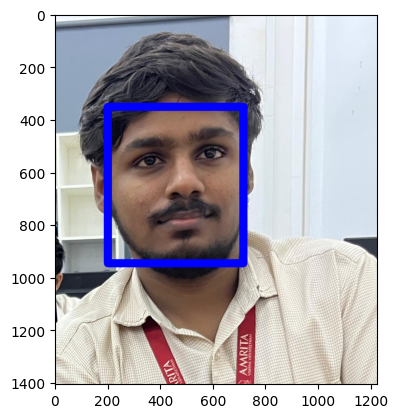

In [8]:
x,y,w,h = results[0]['box']
img = cv.rectangle(img, (x,y), (x+w, y+h), (0,0,255), 30)
plt.imshow(img)

In [9]:
# Get keypoints
left_eye = results[0]['keypoints']['left_eye']
right_eye = results[0]['keypoints']['right_eye']

In [10]:
# Draw bounding box around left eye
left_eye_x, left_eye_y = left_eye
eye_box_size = 60  # Size of the eye bounding box
img = cv.rectangle(img, (left_eye_x - eye_box_size, left_eye_y - eye_box_size),
                   (left_eye_x + eye_box_size, left_eye_y + eye_box_size), (0, 255, 0), 5)

# Draw bounding box around right eye
right_eye_x, right_eye_y = right_eye
img = cv.rectangle(img, (right_eye_x - eye_box_size, right_eye_y - eye_box_size),
                   (right_eye_x + eye_box_size, right_eye_y + eye_box_size), (0, 255, 0), 5)

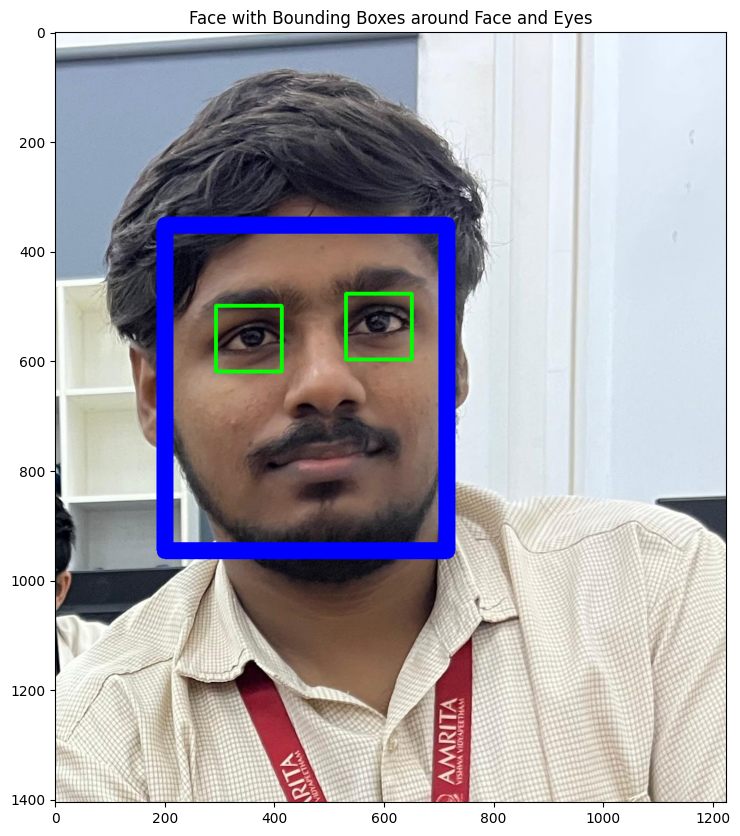

In [11]:
# Show the image with bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.title("Face with Bounding Boxes around Face and Eyes")
plt.show()

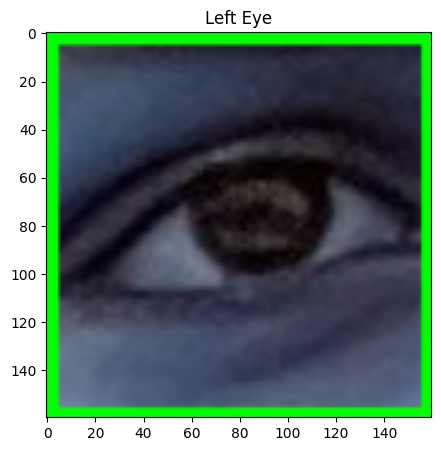

In [12]:
# Zoom into the left eye
left_eye_img = img[left_eye_y - eye_box_size:left_eye_y + eye_box_size,
                   left_eye_x - eye_box_size:left_eye_x + eye_box_size]
left_eye_img = cv.resize(left_eye_img, (160, 160))  # Resize for display
plt.figure(figsize=(5, 5))
plt.imshow(cv.cvtColor(left_eye_img, cv.COLOR_BGR2RGB))
plt.title("Left Eye")
plt.show()

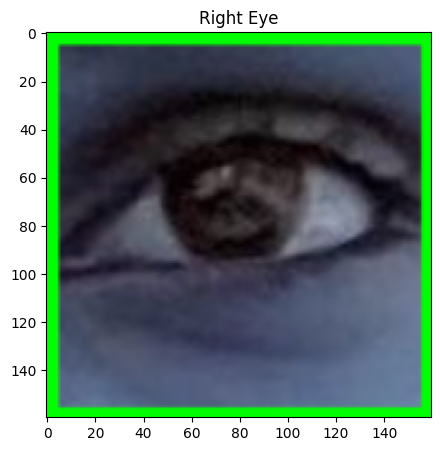

In [13]:
# Zoom into the right eye
right_eye_img = img[right_eye_y - eye_box_size:right_eye_y + eye_box_size,
                    right_eye_x - eye_box_size:right_eye_x + eye_box_size]
right_eye_img = cv.resize(right_eye_img, (160, 160))  # Resize for display
plt.figure(figsize=(5, 5))
plt.imshow(cv.cvtColor(right_eye_img, cv.COLOR_BGR2RGB))
plt.title("Right Eye")
plt.show()

In [14]:
def load_images_from_subdirectories(folder_path):
    images = []
    class_names = []

    for person_name in os.listdir(folder_path):
        person_folder = os.path.join(folder_path, person_name)

        if os.path.isdir(person_folder):
            for file_name in os.listdir(person_folder):
                img_path = os.path.join(person_folder, file_name)
                img = cv2.imread(img_path)
                if img is not None:
                    images.append(img)
                    class_names.append(person_name)

    print(images)
    print(class_names)
    return images, class_names

In [15]:
# Function to find encodings for loaded images
def find_encodings(images):
    encodings = []

    for img in images:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        encoding = face_recognition.face_encodings(img_rgb)

        if encoding:  # Ensure that the image contains a face
            print(encoding[0])
            encodings.append(encoding[0])

    print(encodings)
    return encodings

In [16]:
# Function to display images with face and eye detection and bounding boxes
def display_with_bounding_boxes(images, class_names):
    for img, name in zip(images, class_names):
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Detect face locations and landmarks
        face_locations = face_recognition.face_locations(img_rgb)
        face_landmarks = face_recognition.face_landmarks(img_rgb)

        annotated_img = img.copy()  # Copy the image for annotation

        if not face_locations or not face_landmarks:
            print(f"No face detected for {name}")
            continue

        # Draw rectangles for faces
        for (top, right, bottom, left) in face_locations:
            cv2.rectangle(annotated_img, (left, top), (right, bottom), (0, 255, 0), 2)

        # Draw circles for eyes
        for landmarks in face_landmarks:
            for eye in ['left_eye', 'right_eye']:
                for (x, y) in landmarks[eye]:
                    cv2.circle(annotated_img, (x, y), 2, (0, 0, 255), -1)

        # Display the image with annotations
        plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Person: {name}")
        plt.axis('off')
        plt.show()

        # Draw circles for eyes and zoom in for individual eyes
        for landmarks in face_landmarks:
            right_eye = landmarks['right_eye']
            left_eye = landmarks['left_eye']

            # Right eye zoomed-in image (second image)
            right_eye_annotated = img.copy()
            for (x, y) in right_eye:
                cv2.circle(right_eye_annotated, (x, y), 2, (0, 0, 255), -1)
            zoomed_right_eye_img = zoom_on_eye(img_rgb, right_eye)
            plt.imshow(cv2.cvtColor(zoomed_right_eye_img, cv2.COLOR_BGR2RGB))
            plt.title(f"Person: {name} (Right Eye Zoomed)")
            plt.axis('off')
            plt.show()

            # Left eye zoomed-in image (third image)
            left_eye_annotated = img.copy()
            for (x, y) in left_eye:
                cv2.circle(left_eye_annotated, (x, y), 2, (0, 0, 255), -1)
            zoomed_left_eye_img = zoom_on_eye(img_rgb, left_eye)
            plt.imshow(cv2.cvtColor(zoomed_left_eye_img, cv2.COLOR_BGR2RGB))
            plt.title(f"Person: {name} (Left Eye Zoomed)")
            plt.axis('off')
            plt.show()

In [17]:
# Helper function to zoom in on an eye region
def zoom_on_eye(img, eye_coords, zoom_factor=2):
    eye_left = min(x for x, y in eye_coords)
    eye_right = max(x for x, y in eye_coords)
    eye_top = min(y for x, y in eye_coords)
    eye_bottom = max(y for x, y in eye_coords)

    # Crop the eye region
    eye_region = img[eye_top:eye_bottom, eye_left:eye_right]

    # Resize to zoom in
    zoomed_eye = cv2.resize(eye_region, (0, 0), fx=zoom_factor, fy=zoom_factor)

    return zoomed_eye


In [20]:
dataset_path = '/content/drive/MyDrive/College/Biometrics/test'  # Path to your training images
print("Loading training images...")
images, class_names = load_images_from_subdirectories(dataset_path)
print(f"Loaded {len(images)} images from {dataset_path}")

print("Finding face encodings...")
known_encodings = find_encodings(images)
print("Encoding complete.")

Loading training images...
[array([[[184, 213, 234],
        [184, 213, 234],
        [182, 210, 234],
        ...,
        [ 78, 153, 139],
        [ 79, 151, 138],
        [ 78, 150, 137]],

       [[184, 213, 234],
        [184, 213, 234],
        [182, 210, 234],
        ...,
        [ 78, 153, 139],
        [ 78, 150, 137],
        [ 77, 149, 136]],

       [[184, 213, 234],
        [184, 213, 234],
        [182, 211, 232],
        ...,
        [ 79, 154, 140],
        [ 78, 150, 137],
        [ 76, 148, 135]],

       ...,

       [[223, 231, 224],
        [223, 231, 224],
        [223, 231, 224],
        ...,
        [ 98, 104,  99],
        [ 87,  92,  90],
        [105, 110, 108]],

       [[223, 232, 222],
        [223, 232, 222],
        [223, 232, 222],
        ...,
        [101, 108, 105],
        [ 76,  83,  80],
        [ 82,  89,  86]],

       [[223, 232, 222],
        [223, 232, 222],
        [223, 232, 222],
        ...,
        [ 85,  92,  89],
        [ 62,  69,  6

Displaying images with bounding boxes...


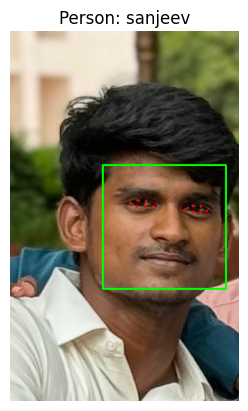

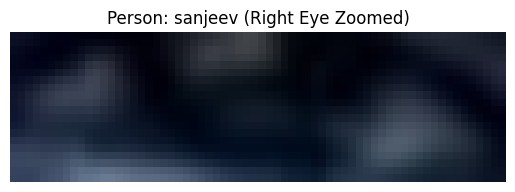

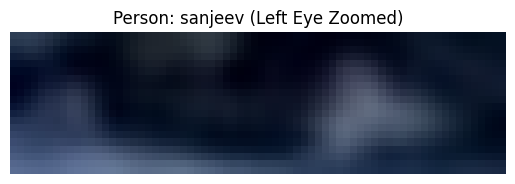

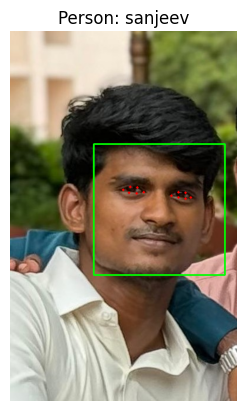

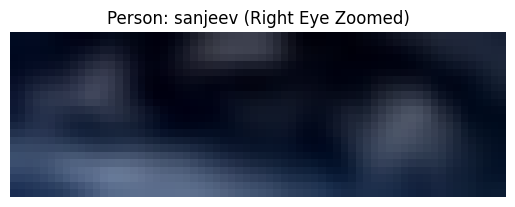

...

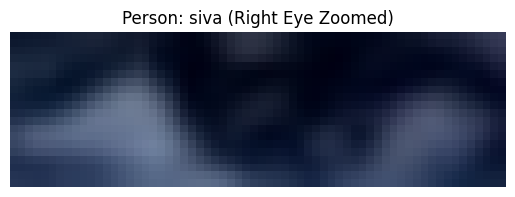

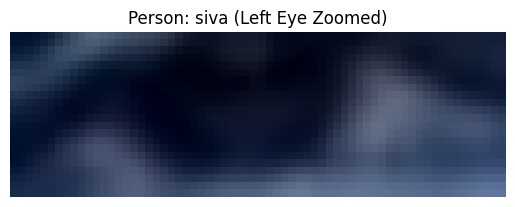

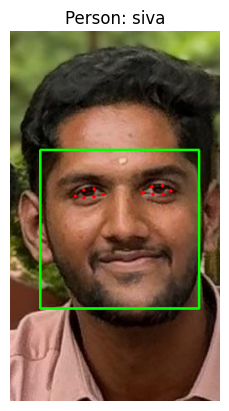

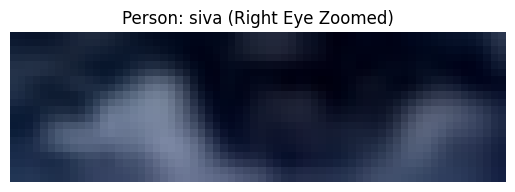

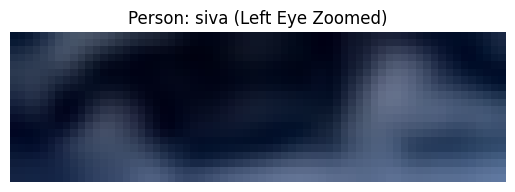

In [21]:
# Display images with bounding boxes during training
print("Displaying images with bounding boxes...")
display_with_bounding_boxes(images, class_names)

In [24]:
# Function to classify and annotate test images
def classify_and_annotate_image(test_image_path, known_encodings, class_names, threshold=0.6):
    test_img = cv2.imread(test_image_path)
    img_rgb = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    face_locations = face_recognition.face_locations(img_rgb)
    face_encodings = face_recognition.face_encodings(img_rgb, face_locations)

    annotated_img = test_img.copy()  # Copy the image for annotation

    for (top, right, bottom, left), encoding in zip(face_locations, face_encodings):
        matches = face_recognition.compare_faces(known_encodings, encoding, tolerance=threshold)
        face_distances = face_recognition.face_distance(known_encodings, encoding)
        best_match_index = np.argmin(face_distances)

        if matches[best_match_index]:
            name = class_names[best_match_index].upper()
            accuracy = (1 - face_distances[best_match_index]) * 100

            # Draw a rectangle around the face
            cv2.rectangle(annotated_img, (left, top), (right, bottom), (0, 255, 0), 2)

            # Draw rectangles around eyes
            face_landmarks = face_recognition.face_landmarks(img_rgb, [(top, right, bottom, left)])[0]
            for eye in ['left_eye', 'right_eye']:
                if eye in face_landmarks:
                    for (x, y) in face_landmarks[eye]:
                        cv2.circle(annotated_img, (x, y), 2, (0, 0, 255), -1)
                    # Draw a bounding box around the eyes
                    eye_coords = face_landmarks[eye]
                    eye_left = min(x for x, y in eye_coords)
                    eye_right = max(x for x, y in eye_coords)
                    eye_top = min(y for x, y in eye_coords)
                    eye_bottom = max(y for x, y in eye_coords)
                    cv2.rectangle(annotated_img, (eye_left, eye_top), (eye_right, eye_bottom), (255, 0, 0), 2)

            # Display annotated image
            plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
            plt.title(f"Recognized as {name} with {round(accuracy, 2)}% accuracy")
            plt.axis('off')
            plt.show()

            return name, round(accuracy, 2), annotated_img

    # If not recognized, display as "Unknown"
    plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
    plt.title("Unknown")
    plt.axis('off')
    plt.show()

    return "Unknown", None, annotated_img

Classifying and annotating test image: /content/drive/MyDrive/College/Biometrics/testing/1.jpg


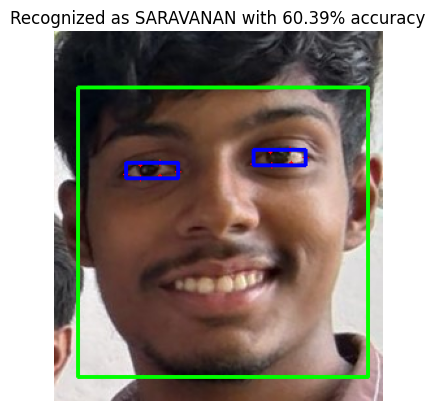

Recognized as SARAVANAN with 60.39% accuracy


In [25]:
# Classify the test image and annotate it
test_image_path = '/content/drive/MyDrive/College/Biometrics/testing/1.jpg'  # Path to your test image
print(f"Classifying and annotating test image: {test_image_path}")
name, accuracy, annotated_img = classify_and_annotate_image(test_image_path, known_encodings, class_names)

if accuracy:
  print(f"Recognized as {name} with {accuracy}% accuracy")
else:
  print("Face not recognized")

Classifying and annotating test image: /content/drive/MyDrive/College/Biometrics/testing/2.jpg


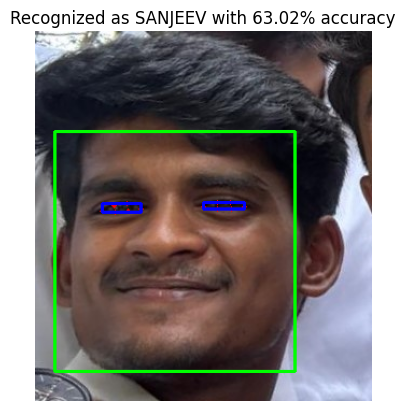

Recognized as SANJEEV with 63.02% accuracy


In [26]:
# Classify the test image and annotate it
test_image_path1 = '/content/drive/MyDrive/College/Biometrics/testing/2.jpg'  # Path to your test image
print(f"Classifying and annotating test image: {test_image_path1}")
name, accuracy, annotated_img = classify_and_annotate_image(test_image_path1, known_encodings, class_names)

if accuracy:
  print(f"Recognized as {name} with {accuracy}% accuracy")
else:
  print("Face not recognized")

Classifying and annotating test image: /content/drive/MyDrive/College/Biometrics/testing/3.jpg


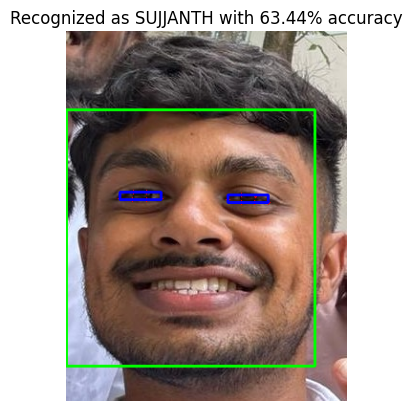

Recognized as SUJJANTH with 63.44% accuracy


In [29]:
# Classify the test image and annotate it
test_image_path1 = '/content/drive/MyDrive/College/Biometrics/testing/3.jpg'  # Path to your test image
print(f"Classifying and annotating test image: {test_image_path1}")
name, accuracy, annotated_img = classify_and_annotate_image(test_image_path1, known_encodings, class_names)

if accuracy:
  print(f"Recognized as {name} with {accuracy}% accuracy")
else:
  print("Face not recognized")

Classifying and annotating test image: /content/drive/MyDrive/College/Biometrics/testing/4.jpg


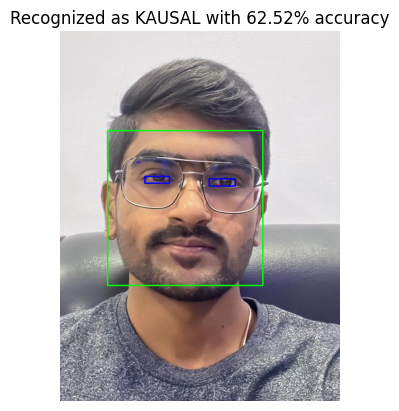

Recognized as KAUSAL with 62.52% accuracy


In [30]:
# Classify the test image and annotate it
test_image_path1 = '/content/drive/MyDrive/College/Biometrics/testing/4.jpg'  # Path to your test image
print(f"Classifying and annotating test image: {test_image_path1}")
name, accuracy, annotated_img = classify_and_annotate_image(test_image_path1, known_encodings, class_names)

if accuracy:
  print(f"Recognized as {name} with {accuracy}% accuracy")
else:
  print("Face not recognized")